In [1]:
# !pip install --upgrade pip

The chosen article is: <b>Integration of spatial transcriptomic and single cell sequencing identifies expression patterns underlying immune and epithelial cell cross-talk in acute kidney injury</b> </br>
DOI: https://pubmed.ncbi.nlm.nih.gov/34003797/

The accession number on the acession viewer website (https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi) leads us to a several files, one of them is GSE171406_Human_Nephrectomy.tar.gz which is the one we need. Extracting this file gives us the Visium data structure which is the best desired structure for ST data (at least for working with ST-Learn).


- filtered_feature_bc_matrix.h5: this file is a compressed format to store the single-cell data. This contains no spatial information, but rather the count information per barcode and index. (see https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/advanced/h5_matrices) for more.
- spatial/...
    - This folder contains all the spatial information, namely the base images, quality control images, some metadata, and the actual .csv file with the spatial information per barcode. (more info here: https://support.10xgenomics.com/spatial-gene-expression/software/pipelines/latest/output/images)
   
    

Note: StLearn also supports explicity building the input data, incase we have some old data to use (https://stlearn.readthedocs.io/en/latest/tutorials/Read_any_data.html) but if we'll only use Visium things should be easy.

In [2]:
# !pip install scikit-learn stlearn opencv-python torch tqdm

['filtered_feature_bc_matrix.h5', 'spatial', 'Visium_Mouse_Olfactory_Bulb_alignment_file.json', 'Visium_Mouse_Olfactory_Bulb_analysis.tar.gz', 'Visium_Mouse_Olfactory_Bulb_cloupe.cloupe', 'Visium_Mouse_Olfactory_Bulb_filtered_feature_bc_matrix.tar.gz', 'Visium_Mouse_Olfactory_Bulb_metrics_summary.csv', 'Visium_Mouse_Olfactory_Bulb_molecule_info.h5', 'Visium_Mouse_Olfactory_Bulb_possorted_genome_bam.bam', 'Visium_Mouse_Olfactory_Bulb_possorted_genome_bam.bam.bai', 'Visium_Mouse_Olfactory_Bulb_raw_feature_bc_matrix.h5', 'Visium_Mouse_Olfactory_Bulb_raw_feature_bc_matrix.tar.gz', 'Visium_Mouse_Olfactory_Bulb_spatial.tar.gz', 'Visium_Mouse_Olfactory_Bulb_spatial_enrichment.csv', 'Visium_Mouse_Olfactory_Bulb_web_summary.html']
['.ipynb_checkpoints', 'aligned_fiducials.jpg', 'detected_tissue_image.jpg', 'scalefactors_json.json', 'tissue_hires_image.png', 'tissue_lowres_image.png', 'tissue_positions_list.csv', 'tissue_superres_image.tif']
-------
images in dir:


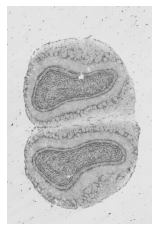

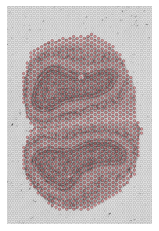

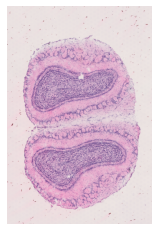

tissue_positions_list.csv
                    0  1  2  3     4     5
0  ACGCCTGACACGCGCT-1  0  0  0  8668  1102
1  TACCGATCCAACACTT-1  0  1  1  8611  1200
2  ATTAAAGCGGACGAGC-1  0  0  2  8554  1102
3  GATAAGGGACGATTAG-1  0  1  3  8498  1200
4  GTGCAAATCACCAATA-1  0  0  4  8441  1102


In [1]:
import os
# os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
import cv2
import matplotlib.pyplot as plt
import pandas as pd
BASE_DIR = 'data/Visium_Mouse_Olfactory_Bulb'
print(os.listdir(BASE_DIR)[1:])
spatial_dir = os.path.join(BASE_DIR, 'spatial')
print(os.listdir(spatial_dir))

print('-------')

print('images in dir:')
for img in [k for k in os.listdir(spatial_dir) if k.endswith('.jpg') or k.endswith('.png')][:-1]:
#     plt.figure(figsize=(12, 12))
#     plt.title(img)
    plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(spatial_dir, img)), cv2.COLOR_BGR2RGB)[400:1600, 700:1500])
    plt.axis('off')
    plt.show()
    
print('tissue_positions_list.csv')
print(pd.read_csv(os.path.join(spatial_dir, 'tissue_positions_list.csv'), header=None).head(5))

In [2]:
N_CLUSTERS = 7

In [3]:
import stlearn as st
import numpy as np
from pathlib import Path
st.settings.set_figure_params(dpi=180)

DATASET_NAME = 'Visium_Mouse_Olfactory_Bulb'

# Defining paths
BASE_PATH = Path(f'data/{DATASET_NAME}')

# Temporary path for tile storage
TILE_PATH = Path("tmp/tiles")
TILE_PATH.mkdir(parents=True, exist_ok=True)

# output path
OUT_PATH = Path(f"out/{DATASET_NAME}")
OUT_PATH.mkdir(parents=True, exist_ok=True)

In [4]:
os.path.join(BASE_PATH, 'tissue_superres_image.tif')

'data\\Visium_Mouse_Olfactory_Bulb\\tissue_superres_image.tif'

In [5]:
data = st.Read10X(BASE_PATH, quality='fulres', image_path=os.path.join(BASE_PATH, 'spatial', 'tissue_superres_image.tif'))

# Apparently when loading a specific requested quality, the hires and lowres aren't scaled correctly
# data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['images']['hires'] = data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['images']['hires'] * 255
# data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['images']['lowres'] = data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['images']['lowres'] * 255
data

C:\Users\Itay\anaconda3\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 1185 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Data is an annotated sparse matrix of observations x variables.

In [6]:
# "- Keep genes with at least 177 non zero spots
# "- Keep genes with total expression of at least 10 over all spots"
# "9528 genes"

In [7]:
colors_map_dict = {
    '#1f77b4': 1, # Blue
    '#f87f13': 0, # Orange
    '#359c62': 3, # Green
    '#d32929': 4, # Red
    '#69308e': 5, # Purple
    '#8c564c': 6, # Brown
    '#f33ca9': 2  # Pink
}
clusters_colors = [c[0] for c in sorted(colors_map_dict.items(), key=lambda i: i[1])]
data.uns['X_pca_kmeans_colors'] = clusters_colors

In [8]:
min_cells = int(data.n_obs * 0.01)
print('min spots for gene to enter analysis', min_cells)
# n_spots, n_genes = X.shape

min spots for gene to enter analysis 11


In [9]:
print('Initial sparsity %', 1 - data.X.nnz / (data.X.shape[0] * data.X.shape[1]))

Initial sparsity % 0.8553831415746754


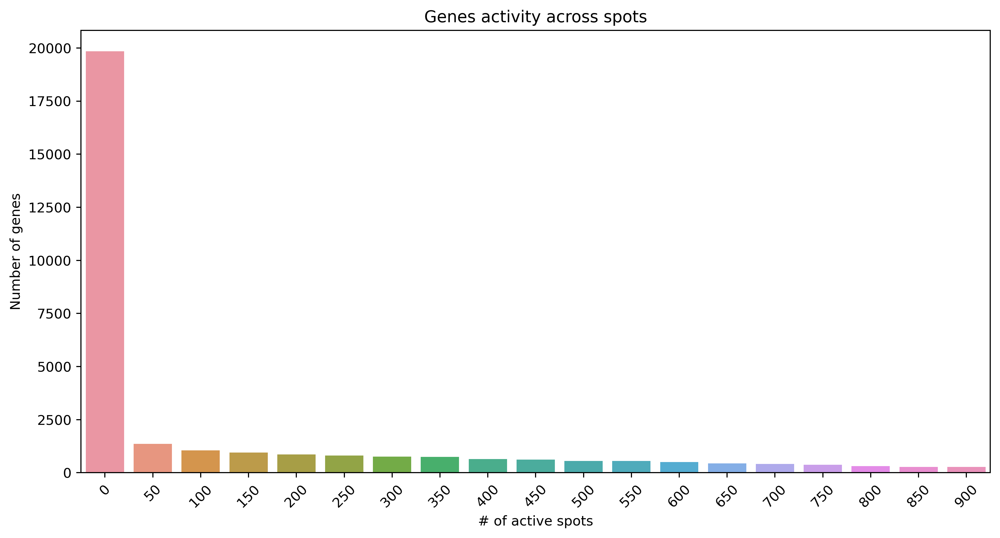

In [10]:
X = data.X.toarray()
spot_activity = (X > 0).sum(axis=0)
import seaborn as sns
bin_count, bin_val = np.histogram(spot_activity, bins=[i*50 for i in range(20)])
plt.figure(figsize=(12, 6))
plt.title('Genes activity across spots')
plt.ylabel('Number of genes')
plt.xlabel('# of active spots')
sns.barplot(x=bin_val[:-1].astype(int), y=bin_count)
# plt.yscale('log')

plt.xticks(rotation = 45)
plt.show()

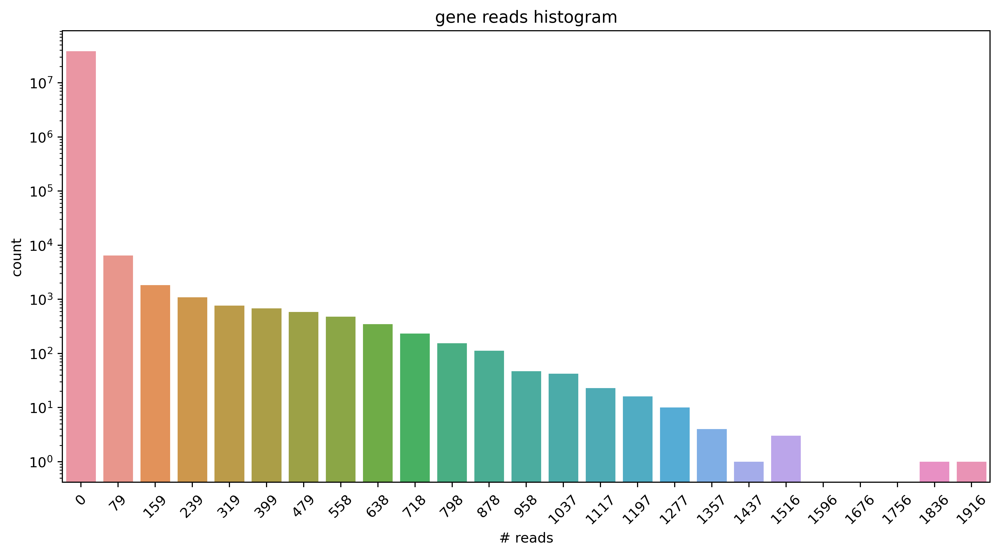

In [11]:

import seaborn as sns
bin_count, bin_val = np.histogram(X, bins=25)
plt.figure(figsize=(12, 6))
plt.title('gene reads histogram')
plt.ylabel('count')
plt.xlabel('# reads')
sns.barplot(x=bin_val[:-1].astype(int), y=bin_count)
plt.yscale('log')
plt.xticks(rotation = 45)
plt.show()

In [12]:
print(data.shape)
st.pp.filter_genes(data,min_cells=min_cells)
# st.pp.filter_genes(data,min_counts=10)

print(data.shape)
st.pp.normalize_total(data)
X = data.X.toarray()
# print(data.shape)
# st.pp.log1p(data)

(1185, 32285)
(1185, 14933)
Normalization step is finished in adata.X


In [13]:
print('Post gene filtering sparsity %', 1 - data.X.nnz / (data.X.shape[0] * data.X.shape[1]))

Post gene filtering sparsity % 0.6881866429545642


In [14]:
bin_count, bin_val = np.histogram(X[(X < 100) & (X > 0)], bins=25)

# The final bin will include the entire range, adding it
bin_count = np.hstack([bin_count, np.zeros(2)])
bin_val = np.hstack([bin_val, np.ones(1) * np.inf])
bin2dropoff = (bin_count / bin_count.sum())

X_flat = X.flatten()
dropoff_flat = bin2dropoff[(np.digitize(X, bins=bin_val))].flatten()
all_indices = np.arange(X_flat.shape[0])
nonzero_indices = np.where(X_flat)[0]

In [15]:
all_indices.shape

(17695605,)

In [16]:
nonzero_indices.shape

(5517726,)

In [17]:
all_indices.shape

(17695605,)

In [18]:
DESIRED_DROPOFF_RATIO = 0.50
N_dropped = int(nonzero_indices.shape[0] * DESIRED_DROPOFF_RATIO)
N_dropped
# DESIRED_DROPOFF_RATIO = 0.1
# N_dropped = int(all_indices.shape[0] * DESIRED_DROPOFF_RATIO)
# N_dropped

2758863

In [19]:
dropped_indices = np.random.choice(nonzero_indices, 
                                   size=N_dropped,
                                   replace=False)
#                                    p=dropoff_flat[nonzero_indices] / dropoff_flat[nonzero_indices].sum())
print(f'dropped nonzero indices: {dropped_indices.shape[0]}')
# print(f'drop ratio (nonzero): {dropped_indices.shape[0] / nonzero_indices.shape[0]:.2f}')
print(f'drop ratio (original): {dropped_indices.shape[0] / X_flat.shape[0]:.2f}')


X_dropped = X.copy()
X_dropped[np.unravel_index(dropped_indices, X.shape)] = 0
X_dropped

print(f'Non zero values - original n {(X > 0).sum()}, post-drop n {(X_dropped > 0).sum()}')

dropped nonzero indices: 2758863
drop ratio (original): 0.16
Non zero values - original n 5517726, post-drop n 2758863


BASELINE, UNDROPPED
Normalization step is finished in adata.X
Log transformation step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1316: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


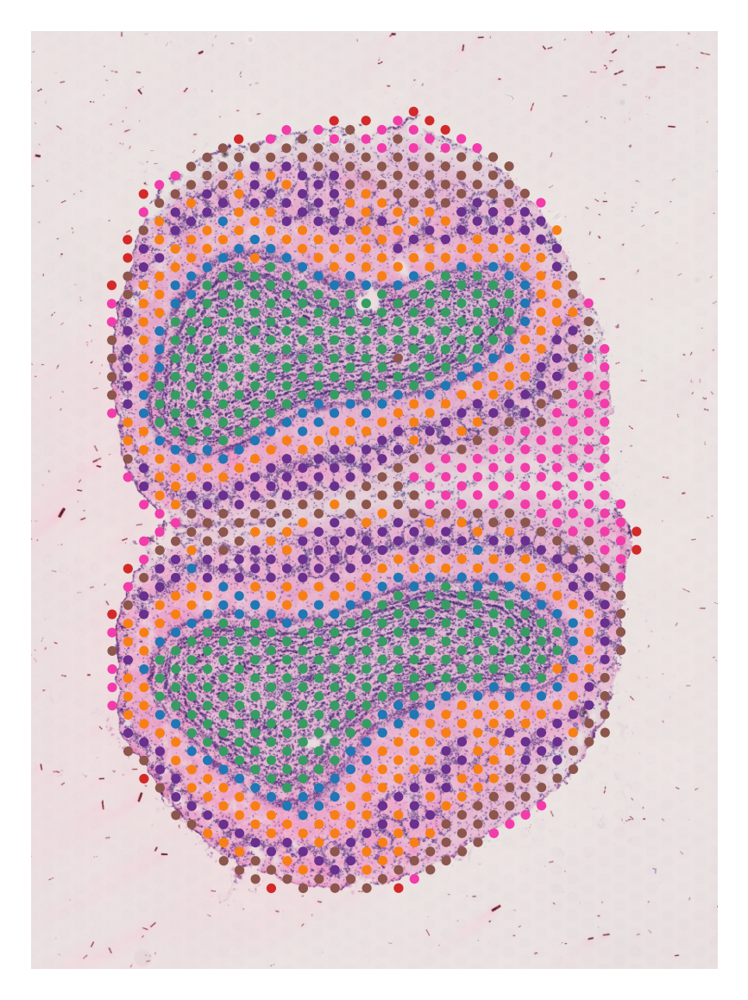

In [20]:
print('BASELINE, UNDROPPED')

stlearn_data_ = data.copy()
st.pp.normalize_total(stlearn_data_)
st.pp.log1p(stlearn_data_)
st.em.run_pca(stlearn_data_,n_comps=50)
st.tl.clustering.kmeans(stlearn_data_, n_clusters=7, use_data="X_pca", key_added="X_pca_kmeans")
st.pl.cluster_plot(stlearn_data_, use_label="X_pca_kmeans", show_cluster_labels=False, show_color_bar=False)

Normalization step is finished in adata.X
Log transformation step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1316: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


<Figure size 1080x720 with 0 Axes>

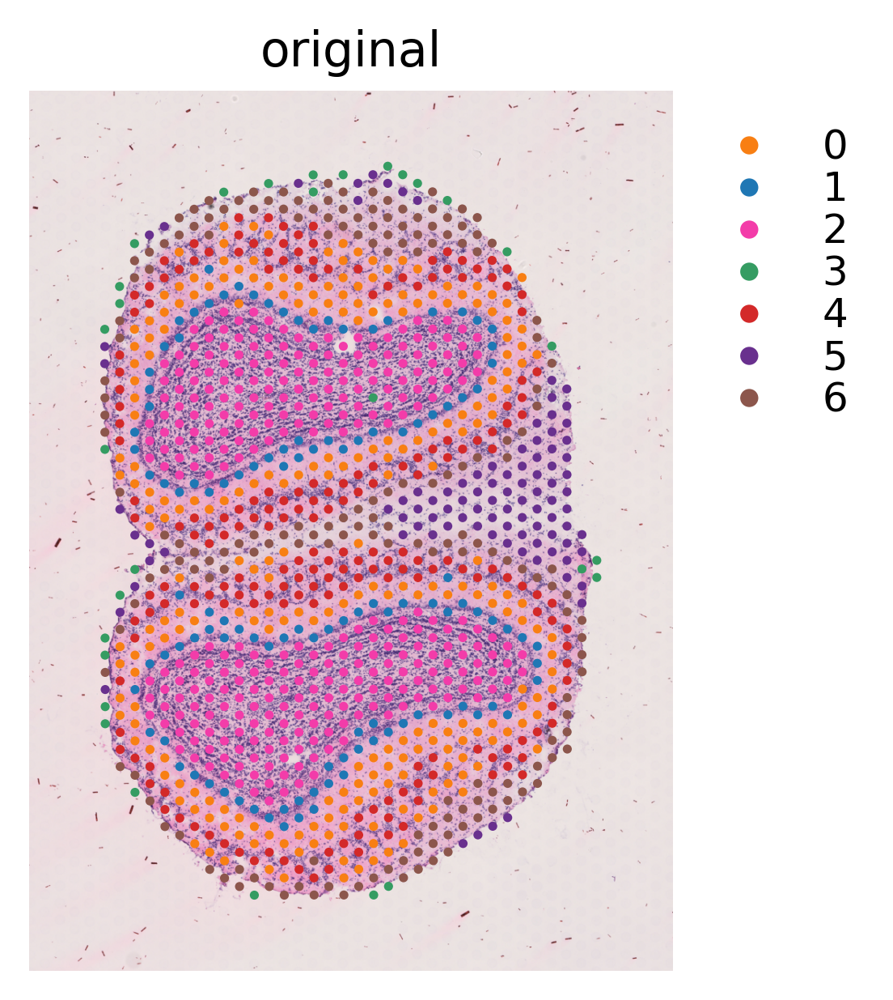

In [64]:
stlearn_data_ = data.copy()
st.pp.normalize_total(stlearn_data_)
st.pp.log1p(stlearn_data_)
stlearn_clustering(stlearn_data_, 'original')

In [21]:
dropped_data = data.copy()
dropped_data.X = X_dropped.copy()

BASELINE, DROPPED
Normalization step is finished in adata.X
Log transformation step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1316: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


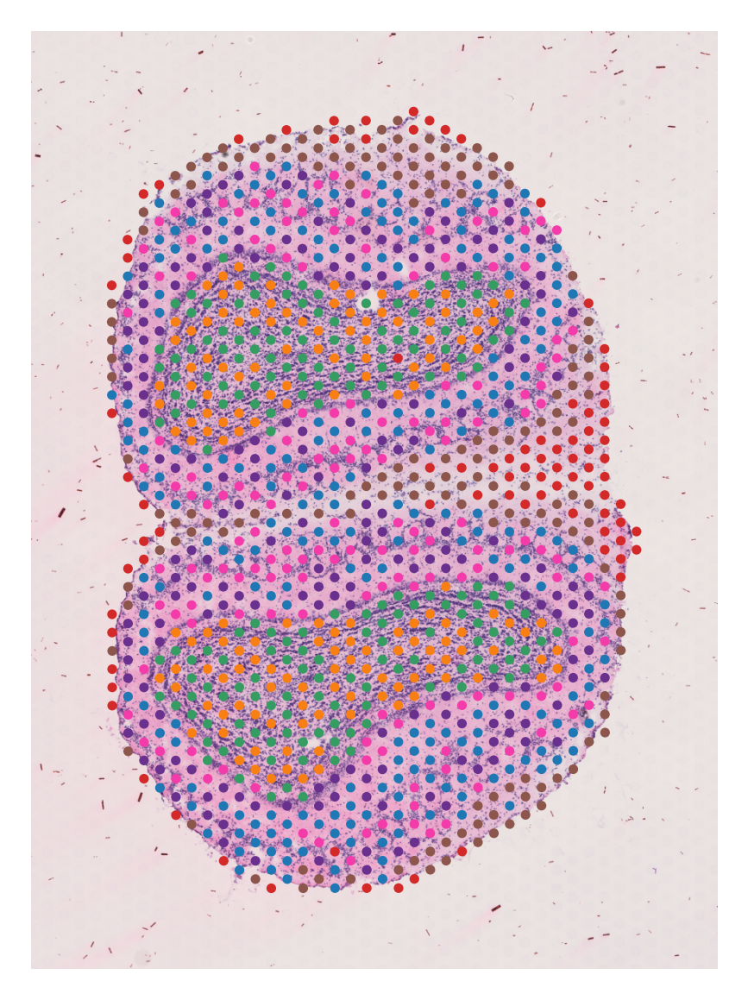

In [22]:
print('BASELINE, DROPPED')

stlearn_data_ = dropped_data.copy()
st.pp.normalize_total(stlearn_data_)
st.pp.log1p(stlearn_data_)
st.em.run_pca(stlearn_data_,n_comps=50)
st.tl.clustering.kmeans(stlearn_data_, n_clusters=7, use_data="X_pca", key_added="X_pca_kmeans")
st.pl.cluster_plot(stlearn_data_, use_label="X_pca_kmeans", show_cluster_labels=False, show_color_bar=False)

In [23]:
def scale_data(D):
    D

In [24]:
# mm_scaler = MinMaxScaler(feature_range=(0, 1), clip=True)

In [25]:
# mm_scaler = mm_scaler.fit(np.vstack([X, np.zeros((1, X.shape[1]))]))
# X_scaled = mm_scaler.transform(X)

In [26]:
col_idx = np.tile(np.arange(X.shape[1]), (X.shape[0]))
row_idx = np.repeat(np.arange(X.shape[0]), (X.shape[1]))
vals = X.flatten()

# print(col_idx.shape, row_idx.shape, vals.shape)
pair_array = np.vstack((col_idx, row_idx, vals)).T


test_idx = 10084
print(col_idx[test_idx])
print(row_idx[test_idx])
print(pair_array[test_idx])
print(X[row_idx[test_idx], col_idx[test_idx]])

10084
0
[10084.     0.     0.]
0.0


In [27]:
(pair_array[:, 2] == 0).sum()

12177879

In [28]:
from sklearn.model_selection import train_test_split
# Train-test splitting the pair array based on dropped indices
test_indices = dropped_indices
train_indices = all_indices[~np.isin(all_indices, dropped_indices)]
train_indices, validation_indices = train_test_split(train_indices, test_size=0.2)
# validation_indices, test_indices = train_test_split(dropped_indices, train_size=0.1)

# train_indices, validation_indices = train_test_split(train_indices, train_size=0.9)
# print(train_indices.shape, validation_indices.shape, test_indices.shape)

assert train_indices.shape[0] + validation_indices.shape[0] + test_indices.shape[0] == X_flat.shape[0]

In [29]:
print('train non zero', len(set(train_indices).intersection(nonzero_indices)))
print('val non zero', len(set(validation_indices).intersection(nonzero_indices)))
print('test non zero', len(set(test_indices).intersection(nonzero_indices)))

train non zero 2207179
val non zero 551684
test non zero 2758863


In [30]:
def plot_rmse_history(train_rmse_hist, validation_rmse_hist):
    plt.figure(figsize=(8, 3))
    plt.title('RMSE by epoch')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.plot(np.arange(len(train_rmse_hist)), train_rmse_hist, label='train RMSE')
    plt.plot(np.arange(len(validation_rmse_hist)), validation_rmse_hist, label='validation RMSE')
    plt.legend()
    plt.show()

In [31]:
from src.datsets import SpotAutoEncoderDataset

In [32]:
# torch.pdist(gmf_model_with_reg.model.spot_embeddings.weight)

In [33]:
import os
n_genes = data.n_vars
n_spots = data.n_obs

BATCH_SIZE = 4096
NUM_WORKERS = 0
train_dataloader = torch.utils.data.DataLoader(
                        SpotAutoEncoderDataset(
                            torch.Tensor(pair_array[train_indices]).to(dtype=torch.int),
                            X.shape[0], X.shape[1]
                        ), 
                        batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)
val_dataloader = torch.utils.data.DataLoader(
                        SpotAutoEncoderDataset(
                            torch.Tensor(pair_array[validation_indices]).to(dtype=torch.int),
                            X.shape[0], X.shape[1]
                        ), 
                        batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)

In [34]:
from src.models import AutoEncoder

In [35]:
from src.training import AbstractModelTrainer, AutoEncoderTrainer

In [36]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [402]:
# device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
# print('running on device: ', device)

# N_EPOCHS = 2000

# K=7
# reg_lambda = 1e4
# spatial_reg_factor = 0


# spot_distance_matrix = torch.Tensor(scipy.spatial.distance.cdist(data.obs[['array_row', 'array_col']].values,
#                                                data.obs[['array_row', 'array_col']].values)).to(device)
# # spot_distance_matrix = None
# # np.argsort(distance_matrix[spot_indices, :])[:K]

N_EPOCHS = 200
reg_lambda=0
lr = 5e-4
EMBEDDING_DIM = 512
autoenc = AutoEncoder(n_genes, hidden_size=EMBEDDING_DIM, init_std=0.01).to(device)
autoenc_trainer = AutoEncoderTrainer(train_dataloader, val_dataloader, 
                                     autoenc, device, lr=lr, reg_lambda=reg_lambda, n_epochs=N_EPOCHS)
train_hist_with_reg, validation_hist_with_reg, train_rmse_hist_with_reg, validation_rmse_hist_with_reg = autoenc_trainer.train()

Validation: 100%|███████████████████████████████████████████| 1/1 [00:00<00:00,  6.90it/s, Loss=9.13e+7, rmse=15.66289]


In [403]:
torch.save(autoenc, 'autoencoder.torch')

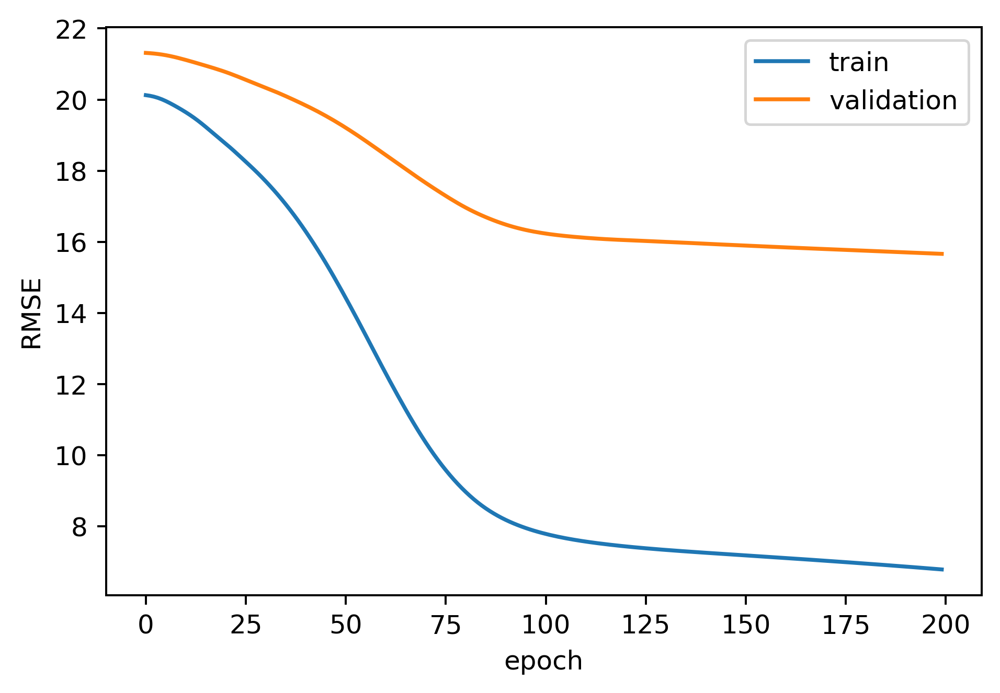

In [404]:
# plt.plot(train_hist_with_reg)
plt.plot(train_rmse_hist_with_reg, label='train')
plt.plot(validation_rmse_hist_with_reg, label='validation')
plt.legend()
plt.xlabel('epoch')
plt.ylabel('RMSE')
plt.show()

In [8]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
from src.evaluation import AutoEncoderEvaluator

In [407]:
test_dataloader = torch.utils.data.DataLoader(
                        SpotAutoEncoderDataset(
                            torch.Tensor(pair_array).to(dtype=torch.int),
                            X.shape[0], X.shape[1]
                        ), 
                        batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)

In [52]:
def quantify_evaluation_df(evaluation_df, test_indices):
    evaluation_df['pred_count'] = np.clip(evaluation_df['pred_count'], 0, np.inf)
    evaluation_df['error'] = evaluation_df['pred_count'] - evaluation_df['count']
#     evaluation_df['log_error'] = np.log1p(np.abs(evaluation_df['count'] - evaluation_df['pred_count']))
    # evaluation_df['exp_error'] = evaluation_df['pred_count'] - evaluation_df['count'].apply(np.exp)
    evaluation_df['abs_error'] = np.abs(evaluation_df['error'])
    test_df = evaluation_df.iloc[test_indices]

    print('-- ALL DATA --')
    print('RMSE', (np.sqrt((evaluation_df['error'] ** 2).mean())))
    print('RMSE non zero', (np.sqrt((evaluation_df[evaluation_df['count'] > 0]['error'] ** 2).mean())))
    print('RMSE non zero - log1p', np.log1p((np.sqrt((evaluation_df[evaluation_df['count'] > 0]['error'] ** 2).mean()))))

    # print('mean absolute error', test_df['abs_error'].mean())
    # print('mean absolute error nonzero', test_df[test_df['count'] > 0]['abs_error'].mean())
    print('-- TEST ONLY --')
    print('RMSE', (np.sqrt((test_df['error'] ** 2).mean())))
    print('RMSE non zero', (np.sqrt((test_df[test_df['count'] > 0]['error'] ** 2).mean())))
    print('RMSE non zero - log1p', np.log1p((np.sqrt((test_df[test_df['count'] > 0]['error'] ** 2).mean()))))

In [409]:
evaluation_df = AutoEncoderEvaluator().evaluate(autoenc, test_dataloader, device)
quantify_evaluation_df(evaluation_df, test_indices)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]


[   0    0    0 ... 1184 1184 1184] [    0     1     2 ... 14930 14931 14932]
-- ALL DATA --
RMSE 13.054177528948868
RMSE non zero 26.18279916534434
RMSE non zero - log1p 3.3025843896360407
-- TEST ONLY --
RMSE 21.623326633658053
RMSE non zero 26.245392300376782
RMSE non zero - log1p 3.304884416917515


In [410]:
# plt.figure()
# sns.pointplot(y=[3.32, 3.03, 2.82, 2.45, 2.52], x=['16', '128', '512', '4096', '8192'])
# plt.xlabel('Embedding size')
# plt.ylabel('RMSE')
# plt.title('test RMSE vs embedding size')
# plt.show()

In [411]:
imputed_data = dropped_data.copy()
imputed_X = imputed_data.X.copy()
imputed_X[evaluation_df['spot_id'], evaluation_df['gene_id']] = evaluation_df['pred_count']
imputed_X = np.clip(imputed_X, 0, np.inf)
imputed_data.X = imputed_X
st.pp.normalize_total(imputed_data)
st.pp.log1p(imputed_data)

Normalization step is finished in adata.X
Log transformation step is finished in adata.X


In [412]:
print('original non zero: ', data.X.nnz)
print('post imputation nonzero', (imputed_data.X > 0).sum())

original non zero:  5517726
post imputation nonzero 15784838


In [54]:
def stlearn_clustering(data, title):
    data = data.copy()
    st.em.run_pca(data,n_comps=15)
    st.tl.clustering.kmeans(data, n_clusters=7, use_data="X_pca", key_added="X_pca_kmeans")

    
    colors_map_dict = {
        '#1f77b4': 1, # Blue
        '#f87f13': 0, # Orange
        '#359c62': 3, # Green
        '#d32929': 4, # Red
        '#69308e': 5, # Purple
        '#8c564c': 6, # Brown
        '#f33ca9': 2  # Pink
    }
    clusters_colors = [c[0] for c in sorted(colors_map_dict.items(), key=lambda i: i[1])]
    
    data.uns['X_pca_kmeans_colors'] = clusters_colors
    f = plt.figure()
    st.pl.cluster_plot(data, use_label="X_pca_kmeans")
    plt.title(title)
    plt.show()
    


IMPUTED
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1316: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


<Figure size 1080x720 with 0 Axes>

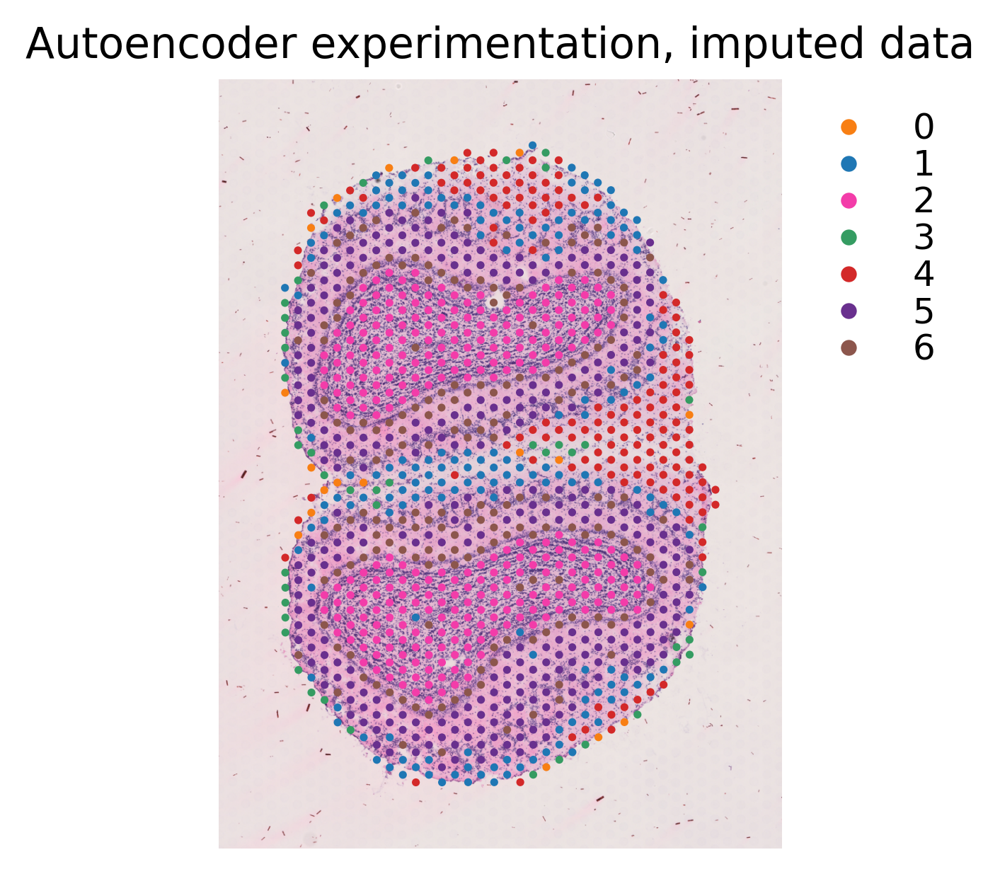

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1316: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


<Figure size 1080x720 with 0 Axes>

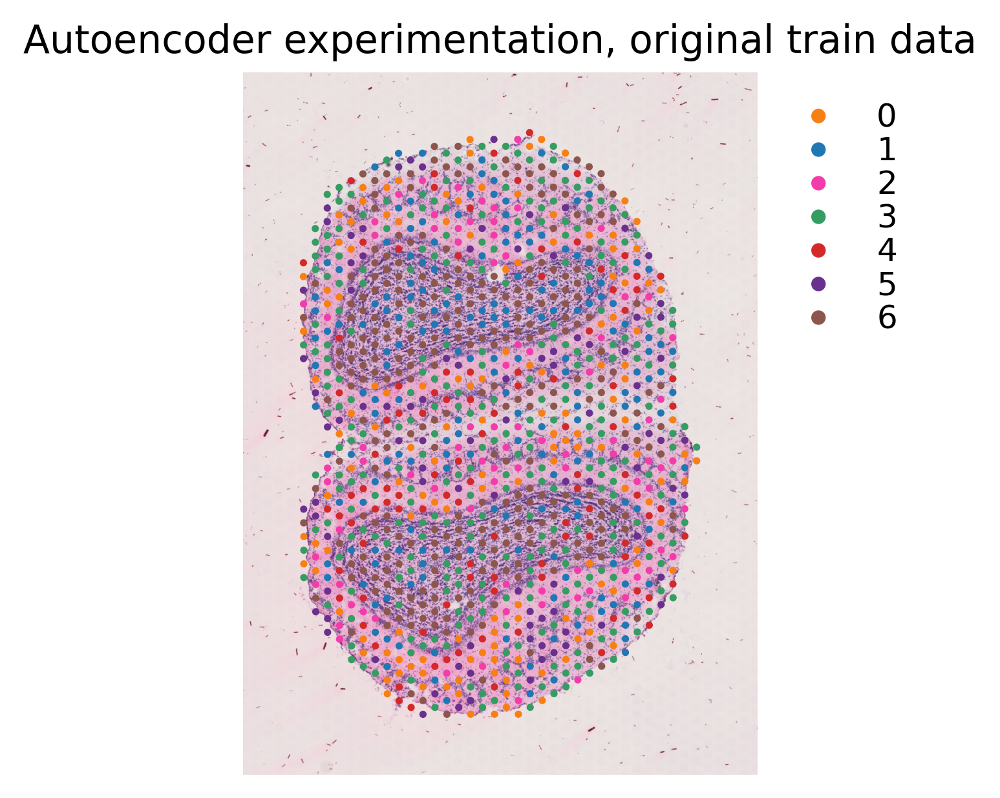

In [414]:
stlearn_clustering(imputed_data, 'Autoencoder experimentation, imputed data')
stlearn_clustering(dropped_data, 'Autoencoder experimentation, original train data')


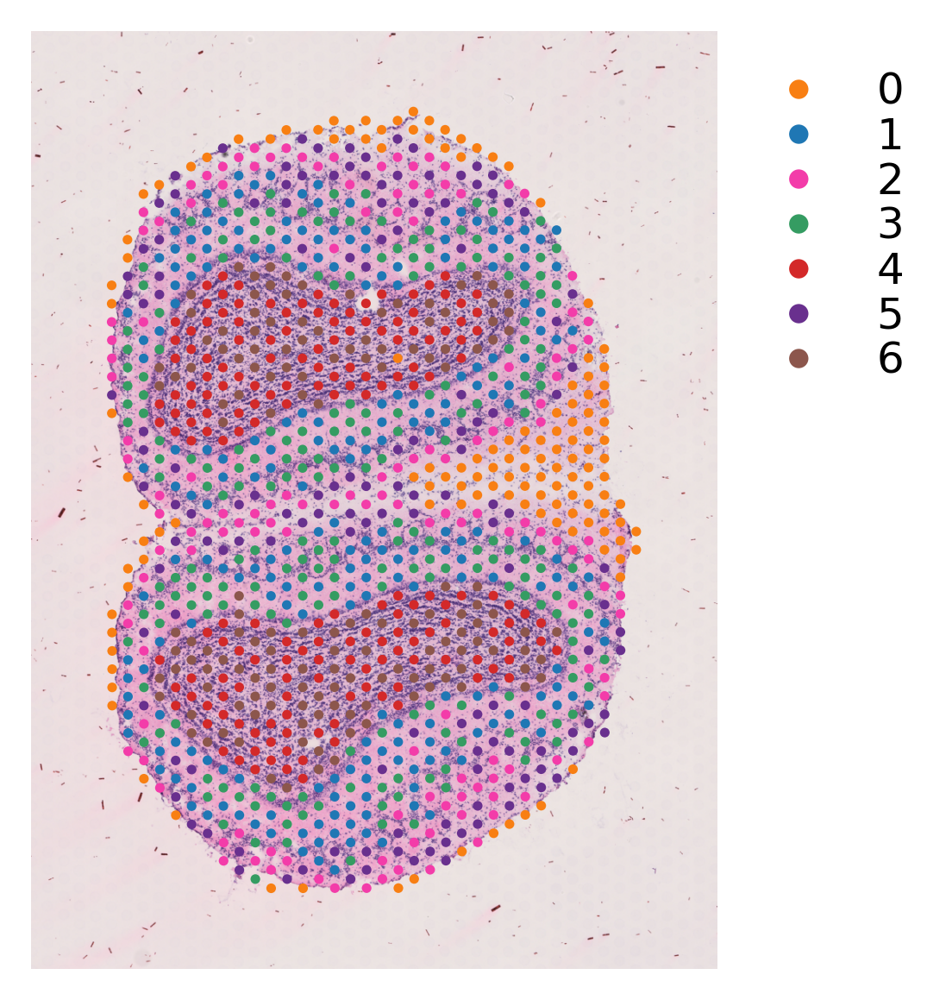

In [638]:
# Doing some voodoo to have the same colors
replace_map = {'0':'4', '1':'0', '2':'1', '3':'3', '4':'6', '5':'5', '6':'2'}
stlearn_data_color_fix = stlearn_data_.copy()
stlearn_data_color_fix.obs.X_pca_kmeans = pd.Categorical(stlearn_data_color_fix.obs.X_pca_kmeans.apply(replace_map.get), categories=['0', '1', '2', '3', '4', '5', '6'])
st.pl.cluster_plot(stlearn_data_color_fix, use_label="X_pca_kmeans", list_clusters=['0', '1', '2', '3', '4', '5', '6'])

## Positional encoding

In [292]:
from src.models import SpotPositionMLP
from src.datasets import SpotPositionDataset
from src.training import SpotPositionTrainer

In [293]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
poly_features = PolynomialFeatures(4)
positions_scaler = StandardScaler()

pos_enc_level = 128
# pos_enc_level = 0
POS_ENC_N = 1
spot_positions = data.obs[['array_row', 'array_col']].values
pos_encs = []
for i in range(1, pos_enc_level + 1):
    pos_encs.append(np.sin(spot_positions[:, 0] / POS_ENC_N ** 2*i))
    pos_encs.append(np.cos(spot_positions[:, 1] / POS_ENC_N ** 2*i))
spot_positions = poly_features.fit_transform(spot_positions)


if pos_encs:
    spot_positions = np.hstack([spot_positions, np.linalg.norm(spot_positions, axis=1).reshape(-1, 1)])
    spot_positions = np.hstack([spot_positions, np.array(pos_encs).T])
spot_positions = positions_scaler.fit_transform(spot_positions)

In [294]:
import os
from sklearn.preprocessing import RobustScaler
n_genes = data.n_vars
n_spots = data.n_obs

POSITION_TRAIN_BATCH_SIZE = 128
NUM_WORKERS = 0
gene_scaler = RobustScaler()
scaled_pair_array = pair_array.copy()

# scaled_pair_array[:, 2] = gene_scaler.fit_transform(np.array(pair_array[:, 2].reshape(n_spots, n_genes))).flatten()

pos_train_dataloader = torch.utils.data.DataLoader(
                        SpotPositionDataset(
                            torch.Tensor(scaled_pair_array[train_indices]).to(dtype=torch.int),
                            X.shape[0], X.shape[1], spot_positions), 
                        batch_size=POSITION_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

pos_val_dataloader = torch.utils.data.DataLoader(
                        SpotPositionDataset(
                            torch.Tensor(scaled_pair_array[validation_indices]).to(dtype=torch.int),
                            X.shape[0], X.shape[1], spot_positions), 
                        batch_size=POSITION_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

In [295]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print('running on device: ', device)

N_EPOCHS = 200
lr = 5e-4
pos_mlp = SpotPositionMLP(spot_positions.shape[1], X.shape[1]).to(device)


running on device:  cuda


In [296]:
reg_lambda = 0
pos_mlp_trainer = SpotPositionTrainer(pos_train_dataloader, pos_val_dataloader, 
                                     pos_mlp, device, lr=lr, n_epochs=N_EPOCHS, reg_lambda=reg_lambda)
train_hist_with_reg, validation_hist_with_reg, train_rmse_hist_with_reg, validation_rmse_hist_with_reg = pos_mlp_trainer.train()


Validation: 100%|██████████████████████████████████████████| 10/10 [00:00<00:00, 68.49it/s, Loss=2.35e+6, rmse=7.75762]


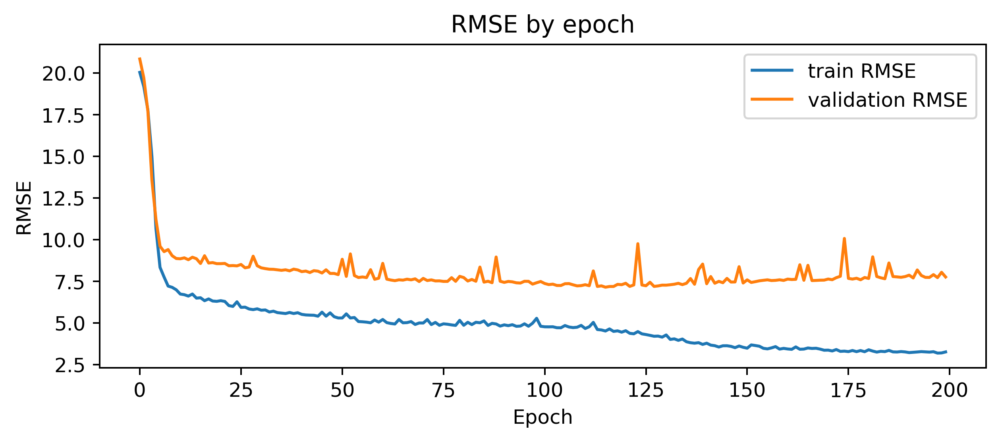

In [297]:
plot_rmse_history(train_rmse_hist_with_reg, validation_rmse_hist_with_reg)

In [298]:
from src.evaluation import PositionalMLPEvaluator

In [299]:
# stlearn_clustering(imputed_data, 'Positional MLP - clean')

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.22it/s]


[   0    0    0 ... 1184 1184 1184] [    0     1     2 ... 14930 14931 14932]
-- ALL DATA --
RMSE 3.4238574574355445
RMSE non zero 5.018171766202176
RMSE non zero - log1p 1.7947835198746764
-- TEST ONLY --
RMSE 4.558732917168484
RMSE non zero 5.444864617784654
RMSE non zero - log1p 1.863283630396229
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1316: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


<Figure size 1080x720 with 0 Axes>

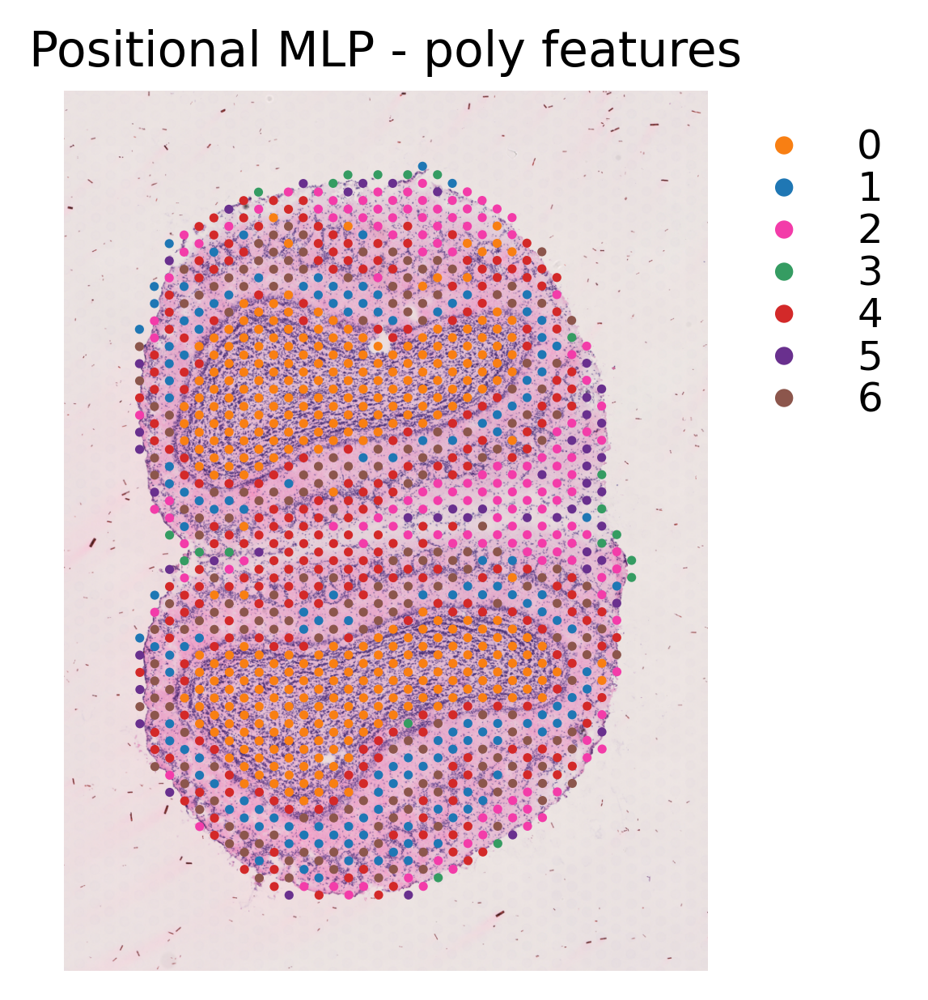

In [300]:
pos_test_dataloader = torch.utils.data.DataLoader(
                        SpotPositionDataset(
                            torch.Tensor(scaled_pair_array).to(dtype=torch.int),
                            X.shape[0], X.shape[1], spot_positions), 
                        batch_size=n_genes, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)

evaluation_df = PositionalMLPEvaluator().evaluate(pos_mlp, pos_test_dataloader, device)
quantify_evaluation_df(evaluation_df, test_indices)

imputed_data = dropped_data.copy()
imputed_X = imputed_data.X.copy()
imputed_X[evaluation_df['spot_id'], evaluation_df['gene_id']] = evaluation_df['pred_count']
# imputed_X[evaluation_df['spot_id'], evaluation_df['gene_id']] = gene_scaler.inverse_transform(np.array(evaluation_df['pred_count'].values.reshape(n_spots, n_genes))).flatten()
imputed_X = np.clip(imputed_X, 0, np.inf)
imputed_data.X = imputed_X

stlearn_clustering(imputed_data, 'Positional MLP - poly features')


## tiling && feature_extraction

## Tiling verification 

In [38]:
from skimage import io
from torchvision import transforms
import torch.nn.functional as F
from torch import nn
toTensor = transforms.ToTensor()
resize = transforms.Resize(224)

In [39]:
# data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['images']['hires'] = data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['images']['hires'].astype('uint8')

In [40]:
import shutil

crop_size = int(np.floor(data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['scalefactors']['spot_diameter_fullres']) * 2)
if os.path.exists(TILE_PATH):
    shutil.rmtree(TILE_PATH)
st.pp.tiling(data, TILE_PATH, crop_size=crop_size, target_size=crop_size)



Tiling image: 100%|██████████████████████████████████████████ [ time left: 00:00 ]


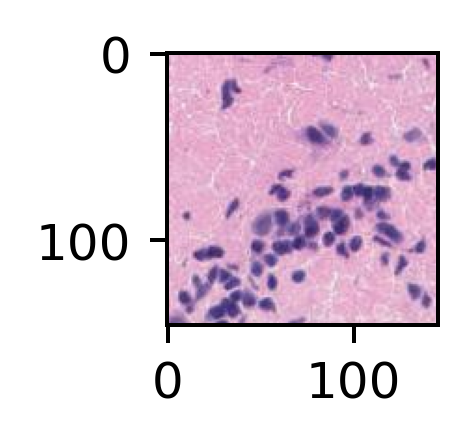

In [41]:
chosen_tile = 10
temp_obs = data.obs.iloc[chosen_tile]
temp_tile = cv2.cvtColor(cv2.imread(temp_obs['tile_path']), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(1, 1))
plt.imshow(temp_tile)

In [42]:
data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['images']['fulres'].shape

(10000, 10000, 4)

In [74]:
from matplotlib.patches import Rectangle
plt.figure(figsize=(15, 15))
plt.imshow(data.uns['spatial']['Visium_Mouse_Olfactory_Bulb']['images']['fulres'])
plt.gca().add_patch(Rectangle((temp_obs['imagecol'] - crop_size / 2,temp_obs['imagerow'] - crop_size / 2),crop_size,crop_size,linewidth=1,edgecolor='r',facecolor='none'))
plt.show()


KeyboardInterrupt: 

In [301]:
# min_row, max_row = data.obs['array_row'].min(), data.obs['array_row'].max()
# min_col, max_col = data.obs['array_col'].min(), data.obs['array_col'].max()

In [302]:
# # Let's place all tiles one near the other
# fig, axs = plt.subplots(nrows=max_row - min_row, ncols=max_col - min_col, figsize=(2, 2))
# fig.axis('off')

In [303]:
# data.obs['array_row'].min()

In [304]:
# plt.figure(figsize=(18, 18))
# plt.imshow(cv2.imread(os.path.join(BASE_PATH, 'spatial', 'tissue_superres_image.tif')))

In [305]:
# import os
# from sklearn.preprocessing import StandardScaler
# from sklearn.preprocessing import PolynomialFeatures

# n_genes = data.n_vars
# n_spots = data.n_obs

# CNN_TRAIN_BATCH_SIZE = 8
# NUM_WORKERS = 0
# gene_scaler = StandardScaler()
# scaled_pair_array = pair_array.copy()

# scaled_pair_array[:, 2] = gene_scaler.fit_transform(np.array(pair_array[:, 2].reshape(n_spots, n_genes))).flatten()

# img_train_dataloader = torch.utils.data.DataLoader(
#                         SpotImageDataset(
#                             torch.Tensor(scaled_pair_array[train_indices]).to(dtype=torch.int),
#                             X.shape[0], X.shape[1], data.obs['tile_path'].values), 
#                         batch_size=CNN_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

# img_val_dataloader = torch.utils.data.DataLoader(
#                         SpotImageDataset(
#                             torch.Tensor(scaled_pair_array[validation_indices]).to(dtype=torch.int),
#                             X.shape[0], X.shape[1], data.obs['tile_path'].values), 
#                         batch_size=CNN_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

# device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
# print('running on device: ', device)

# N_EPOCHS = 100
# lr = 5e-5
# spot_cnn = SpotImageCNN(n_genes).to(device)

# reg_lambda = 0
# pos_mlp_trainer = SpotImageTrainer(img_train_dataloader, img_val_dataloader, 
#                                      spot_cnn, device, lr=lr, n_epochs=N_EPOCHS, reg_lambda=reg_lambda, patience=20)
# train_hist_with_reg, validation_hist_with_reg, train_rmse_hist_with_reg, validation_rmse_hist_with_reg = pos_mlp_trainer.train()


In [306]:
# plt.plot(validation_rmse_hist_with_reg)
# plt.show()

In [307]:
# # pos_test_dataloader = torch.utils.data.DataLoader(
# #                         SpotPositionDataset(
# #                             torch.Tensor(scaled_pair_array).to(dtype=torch.int),
# #                             X.shape[0], X.shape[1], spot_positions), 
# #                         batch_size=n_genes, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)

# img_val_dataloader = torch.utils.data.DataLoader(
#                         SpotImageDataset(
#                             torch.Tensor(scaled_pair_array).to(dtype=torch.int),
#                             X.shape[0], X.shape[1], data.obs['tile_path'].values), 
#                         batch_size=CNN_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)

# evaluation_df = ImageCNNEvaluator().evaluate(spot_cnn, img_val_dataloader, device)
# evaluation_df['error'] = evaluation_df['pred_count'] - evaluation_df['count']
# evaluation_df['abs_error'] = np.abs(evaluation_df['error'])
# print('mean absolute error', evaluation_df['abs_error'].mean())
# print('mean absolute error nonzero', evaluation_df[evaluation_df['count'] > 0]['abs_error'].mean())

# imputed_data = data.copy()
# imputed_X = imputed_data.X.copy().todense()
# imputed_X[evaluation_df['spot_id'], evaluation_df['gene_id']] = gene_scaler.inverse_transform(np.array(evaluation_df['pred_count'].values.reshape(n_spots, n_genes))).flatten()
# imputed_X = np.clip(imputed_X, 0, np.inf)
# imputed_data.X = imputed_X
# st.pp.normalize_total(imputed_data)
# st.pp.log1p(imputed_data)

# print('original non zero: ', data.X.nnz)
# print('post imputation nonzero', (imputed_data.X > 0).sum())

# print('IMPUTED')
# imputed_data_ = imputed_data.copy()
# st.em.run_pca(imputed_data_,n_comps=15)
# st.tl.clustering.kmeans(imputed_data_, n_clusters=7, use_data="X_pca", key_added="X_pca_kmeans")
# st.pl.cluster_plot(imputed_data_, use_label="X_pca_kmeans")

In [430]:
import os
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
import torchvision
import torch

def load_model_weights(model, weights):
    model_dict = model.state_dict()
    weights = {k: v for k, v in weights.items() if k in model_dict}
    if weights == {}:
        print('No weight could be loaded..')
    model_dict.update(weights)
    model.load_state_dict(model_dict)

    return model

def create_histology_resnet_model():
    MODEL_PATH = 'pytorchnative_tenpercent_resnet18.ckpt'
    model = torchvision.models.__dict__['resnet18'](pretrained=False)
    state = torch.load(MODEL_PATH, map_location='cuda:0')
    state_dict = state['state_dict']
    for key in list(state_dict.keys()):
        state_dict[key.replace('model.', '').replace('resnet.', '')] = state_dict.pop(key)

    model = load_model_weights(model, state_dict)
    model.fc = torch.nn.Sequential(
                    torch.nn.Linear(model.fc.in_features, 1024),
                    torch.nn.ReLU(),
                    torch.nn.Linear(1024, 4096),
                    torch.nn.ReLU(),
                    torch.nn.Linear(4096, n_genes),

    )
    model = model.cuda()
    images = torch.rand((10, 3, 224, 224), device='cuda')
    
    # Just to verify it works
    out = model(images)
    
    return model

model = create_histology_resnet_model()
    




In [432]:
from src.datasets import SpotImageDataset
from src.training import SpotImageTrainer
n_genes = data.n_vars
n_spots = data.n_obs


CNN_TRAIN_BATCH_SIZE = 128
NUM_WORKERS = 0
# gene_scaler = StandardScaler()
scaled_pair_array = pair_array.copy()

# scaled_pair_array[:, 2] = gene_scaler.fit_transform(np.array(pair_array[:, 2].reshape(n_spots, n_genes))).flatten()

img_train_dataloader = torch.utils.data.DataLoader(
                        SpotImageDataset(
                            torch.Tensor(scaled_pair_array[train_indices]).to(dtype=torch.int),
                            X.shape[0], X.shape[1], data.obs['tile_path'].values), 
                        batch_size=CNN_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

img_val_dataloader = torch.utils.data.DataLoader(
                        SpotImageDataset(
                            torch.Tensor(scaled_pair_array[validation_indices]).to(dtype=torch.int),
                            X.shape[0], X.shape[1], data.obs['tile_path'].values), 
                        batch_size=CNN_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print('running on device: ', device)

N_EPOCHS = 200
lr = 5e-4

reg_lambda = 0
pos_mlp_trainer = SpotImageTrainer(img_train_dataloader, img_val_dataloader, 
                                     model, device, lr=lr, n_epochs=N_EPOCHS, reg_lambda=reg_lambda, patience=0)
train_hist_with_reg, validation_hist_with_reg, train_rmse_hist_with_reg, validation_rmse_hist_with_reg = pos_mlp_trainer.train()


running on device:  cuda


Validation: 100%|██████████████████████████████████████████| 10/10 [00:02<00:00,  4.14it/s, Loss=1.89e+6, rmse=6.97469]


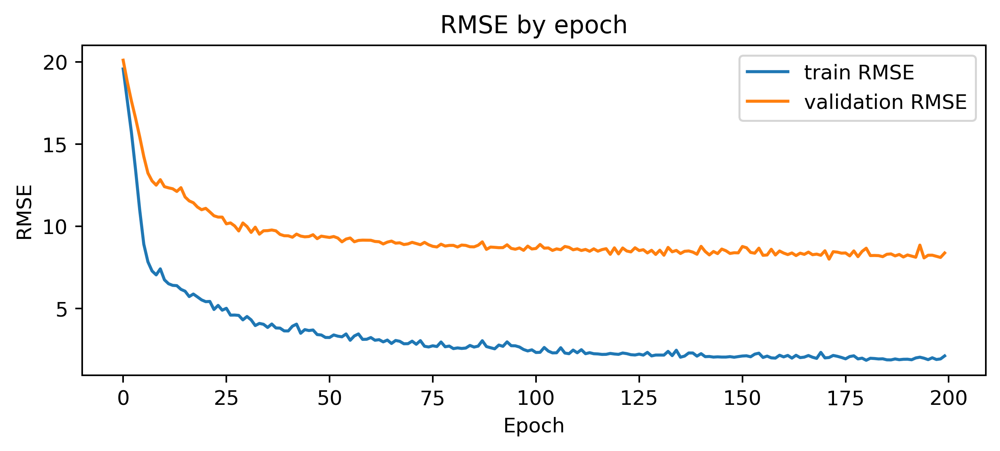

In [48]:
plot_rmse_history(train_rmse_hist_with_reg, validation_rmse_hist_with_reg)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.44it/s]


[   0    0    0 ... 1184 1184 1184] [    0     1     2 ... 14930 14931 14932]
-- ALL DATA --
RMSE 3.4603395351577015
RMSE non zero 4.891022164920304
RMSE non zero - log1p 1.7734295250380405
-- TEST ONLY --
RMSE 4.350101881431556
RMSE non zero 5.1734584428369645
RMSE non zero - log1p 1.8202592064628673
Normalization step is finished in adata.X
Log transformation step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1316: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


<Figure size 1080x720 with 0 Axes>

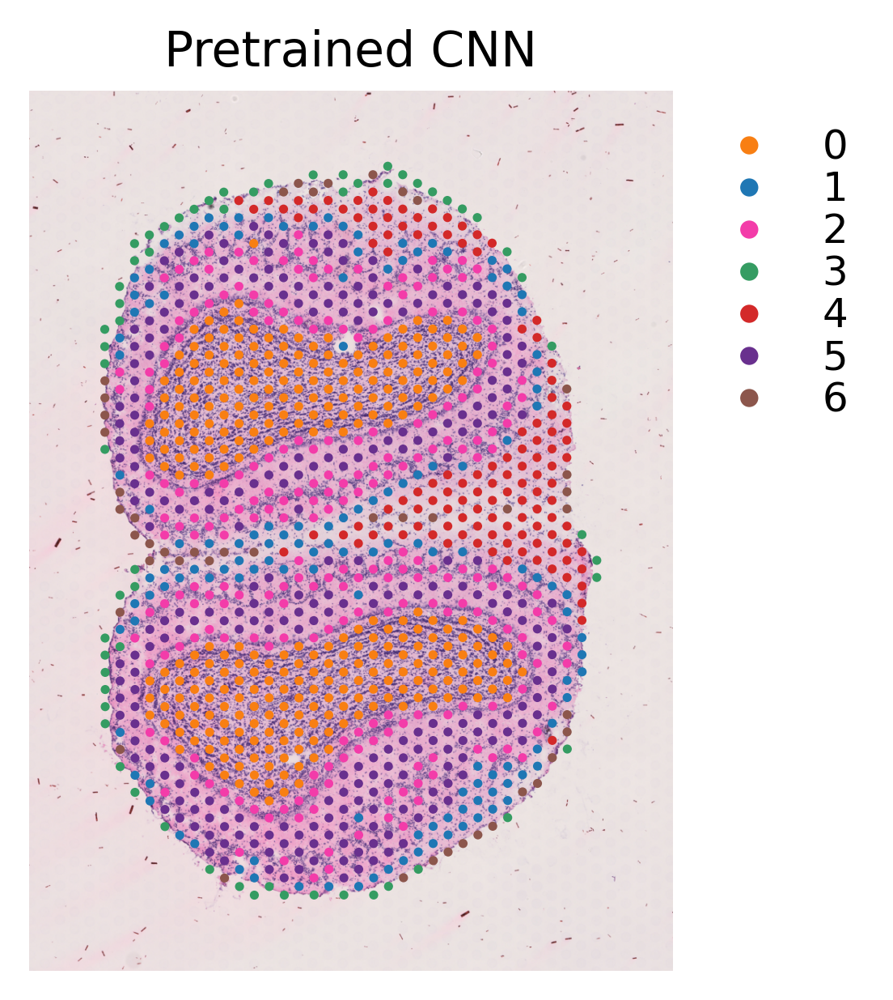

In [435]:
from src.evaluation import ImageCNNEvaluator

img_val_dataloader = torch.utils.data.DataLoader(
                        SpotImageDataset(
                            torch.Tensor(scaled_pair_array).to(dtype=torch.int),
                            X.shape[0], X.shape[1], data.obs['tile_path'].values), 
                        batch_size=CNN_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)

evaluation_df = ImageCNNEvaluator().evaluate(model, img_val_dataloader, device)

quantify_evaluation_df(evaluation_df, test_indices)

imputed_data = dropped_data.copy()
imputed_X = imputed_data.X.copy()
imputed_X[evaluation_df['spot_id'], evaluation_df['gene_id']] = evaluation_df['pred_count']
# imputed_X[evaluation_df['spot_id'], evaluation_df['gene_id']] = gene_scaler.inverse_transform(np.array(evaluation_df['pred_count'].values.reshape(n_spots, n_genes))).flatten()
imputed_X = np.clip(imputed_X, 0, np.inf)
imputed_data.X = imputed_X
st.pp.normalize_total(imputed_data)
st.pp.log1p(imputed_data)

stlearn_clustering(imputed_data, 'Pretrained CNN')

In [347]:
# FOR REPORT - FAKE TILE FAILED TRAINING

In [348]:
# stlearn_impute_data = data.copy()
# # This creates the tile images and associates each observation to a tile
# st.pp.tiling(stlearn_impute_data, TILE_PATH)

# # Uses some pre-trained CNN (resnet50 by default) to extract features from the actual tiles in the image
# # The specification on what happens here is nonexistant, my guess is this runs the data through the network,
# # taking the last FC layer and applying PCA on it (with the amount of components as specificed)
# st.pp.extract_feature(stlearn_impute_data, n_components=15)

# # Runs PCA on the data (based on sklearn)
# st.em.run_pca(stlearn_impute_data,n_comps=50)

# # This is some kind of unique normalization + imputation algorithm - hmm?
# st.spatial.SME.SME_normalize(stlearn_impute_data, use_data="raw")

# # Replacing the underlying data by the result of the normalized SME
# stlearn_impute_data.X = stlearn_impute_data.obsm['raw_SME_normalized']

In [ ]:
# print('original non zero: ', data.X.nnz)
# print('post imputation nonzero', (stlearn_impute_data.X != 0).sum())

We see that imputation was indeed implemented as the number of non zero elements grew from ~9M to ~17.5M

<u>From here we are only working with the post SME data</u>

In [ ]:
# # Scaling data to normalize distribution (unit variance, zero mean)
# st.pp.scale(stlearn_impute_data)

# # Running PCA, this time on the SME data
# st.em.run_pca(stlearn_impute_data,n_comps=15)

# # Applying K-Means clustering, specifiying which data to use and how to call the output
# st.tl.clustering.kmeans(stlearn_impute_data,n_clusters=7, use_data="X_pca", key_added="X_pca_kmeans")

# # Plotting the data with a specified label
# st.pl.cluster_plot(stlearn_impute_data, use_label="X_pca_kmeans")

## Final Model

In [1]:
from src.models import FinalModel
from src.training import FinalModelTrainer
from src.evaluation import FinalModelEvaluator
from src.datasets import FinalModelDataset

In [57]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
poly_features = PolynomialFeatures(4)
positions_scaler = StandardScaler()

pos_enc_level = 16
POS_ENC_N = 10
spot_positions = data.obs[['array_row', 'array_col']].values
pos_encs = []
for i in range(1, pos_enc_level + 1):
    pos_encs.append(np.sin(spot_positions[:, 0] / POS_ENC_N ** 2*i))
    pos_encs.append(np.cos(spot_positions[:, 1] / POS_ENC_N ** 2*i))
    
spot_positions = poly_features.fit_transform(spot_positions)
spot_positions = np.hstack([spot_positions, np.linalg.norm(spot_positions, axis=1).reshape(-1, 1)])
spot_positions = np.hstack([spot_positions, np.array(pos_encs).T])
spot_positions = positions_scaler.fit_transform(spot_positions)


In [58]:
import os
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import PolynomialFeatures
import torchvision
import torch

n_genes = data.n_vars
n_spots = data.n_obs


FINAL_MODEL_BATCH_SIZE = 128
NUM_WORKERS = 0
# gene_scaler = RobustScaler()
# scaled_pair_array = pair_array.copy()

# scaled_pair_array[:, 2] = gene_scaler.fit_transform(np.array(pair_array[:, 2]).reshape(-1, 1))[:, 0]

# train_dataloader = torch.utils.data.DataLoader(
#                         SpotAutoEncoderDataset(
#                             torch.Tensor(pair_array[train_indices]).to(dtype=torch.int),
#                             X.shape[0], X.shape[1]
#                         ), 
#                         batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)

# pos_train_dataloader = torch.utils.data.DataLoader(
#                         SpotPositionDataset(
#                             torch.Tensor(scaled_pair_array[train_indices]).to(dtype=torch.int),
#                             X.shape[0], X.shape[1], spot_positions), 
#                         batch_size=POSITION_TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

final_train_dataloader = torch.utils.data.DataLoader(
                        FinalModelDataset(
                            torch.Tensor(pair_array[train_indices]).to(dtype=torch.int),
                            X.shape[0], X.shape[1],
                            spot_positions,
                             data.obs['tile_path'].values), 
                        batch_size=FINAL_MODEL_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

final_val_dataloader = torch.utils.data.DataLoader(
                        FinalModelDataset(
                            torch.Tensor(pair_array[validation_indices]).to(dtype=torch.int),
                            X.shape[0], X.shape[1],
                            spot_positions,
                             data.obs['tile_path'].values), 
                        batch_size=FINAL_MODEL_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=True)

final_model = FinalModel(n_genes, spot_positions.shape[1],
                          lambda_auto=1, 
                         lambda_pos=1,
                         lambda_image=1,
                         input_noise_factor=0,
                         init_std=0.01,
                          hidden_size=8192, patience=0).to(device)

N_EPOCHS = 200
lr = 5e-5
reg_lambda = 0
final_model_trainer = FinalModelTrainer(final_train_dataloader, 
                                        final_val_dataloader, 
                                         final_model, device, lr=lr, n_epochs=N_EPOCHS, reg_lambda=reg_lambda, patience=0)
train_hist_with_reg, validation_hist_with_reg, train_rmse_hist_with_reg, validation_rmse_hist_with_reg = final_model_trainer.train()


Train epoch 1/200: 100%|█| 10/10 [00:05<00:00,  1.84it/s, Loss=5.93e+7, rmse=19.99
Validation: 100%|████| 10/10 [00:02<00:00,  3.69it/s, Loss=1.49e+7, rmse=20.05738]
Train epoch 2/200: 100%|█| 10/10 [00:04<00:00,  2.07it/s, Loss=5.04e+7, rmse=18.27
Validation: 100%|████| 10/10 [00:02<00:00,  4.10it/s, Loss=1.35e+7, rmse=19.21626]
Train epoch 3/200: 100%|█| 10/10 [00:04<00:00,  2.01it/s, Loss=4.02e+7, rmse=16.42
Validation: 100%|████| 10/10 [00:02<00:00,  3.92it/s, Loss=1.22e+7, rmse=17.83469]
Train epoch 4/200: 100%|█| 10/10 [00:04<00:00,  2.06it/s, Loss=3e+7, rmse=14.33781
Validation: 100%|████| 10/10 [00:02<00:00,  4.33it/s, Loss=1.07e+7, rmse=16.78804]
Train epoch 5/200: 100%|█| 10/10 [00:05<00:00,  1.98it/s, Loss=2.04e+7, rmse=11.62
Validation: 100%|████| 10/10 [00:03<00:00,  3.22it/s, Loss=9.18e+6, rmse=15.68763]
Train epoch 6/200: 100%|█| 10/10 [00:05<00:00,  1.96it/s, Loss=1.33e+7, rmse=9.297
Validation: 100%|████| 10/10 [00:02<00:00,  3.64it/s, Loss=7.72e+6, rmse=14.23656]
Trai

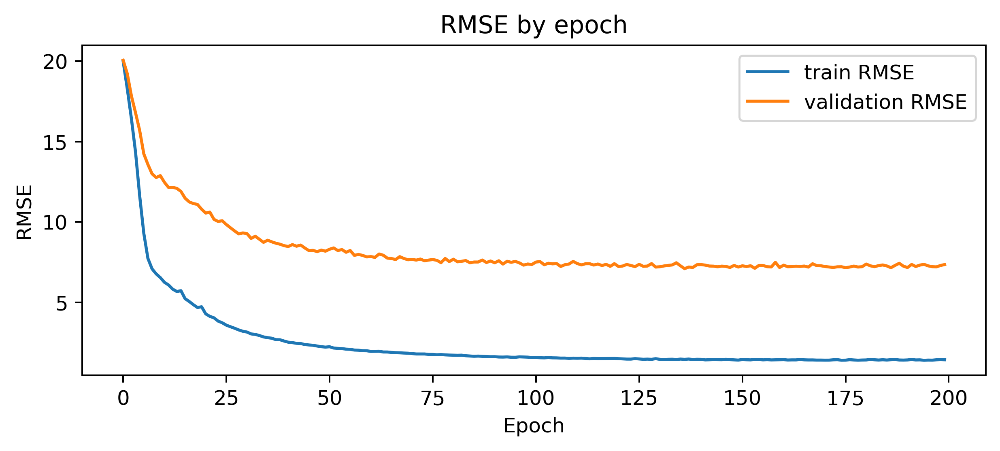

In [ ]:
plot_rmse_history(train_rmse_hist_with_reg, validation_rmse_hist_with_reg)

100%|█████████████████████████████████████████████| 10/10 [00:02<00:00,  3.75it/s]


[   0    0    0 ... 1184 1184 1184] [    0     1     2 ... 14930 14931 14932]
-- ALL DATA --
RMSE 5.4082673349162285
RMSE non zero 10.347894388497469
RMSE non zero - log1p 2.4290322102851687
-- TEST ONLY --
RMSE 8.609495374172134
RMSE non zero 10.41373214443565
RMSE non zero - log1p 2.4348172045564893
Normalization step is finished in adata.X
Log transformation step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1316: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Itay\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


<Figure size 1080x720 with 0 Axes>

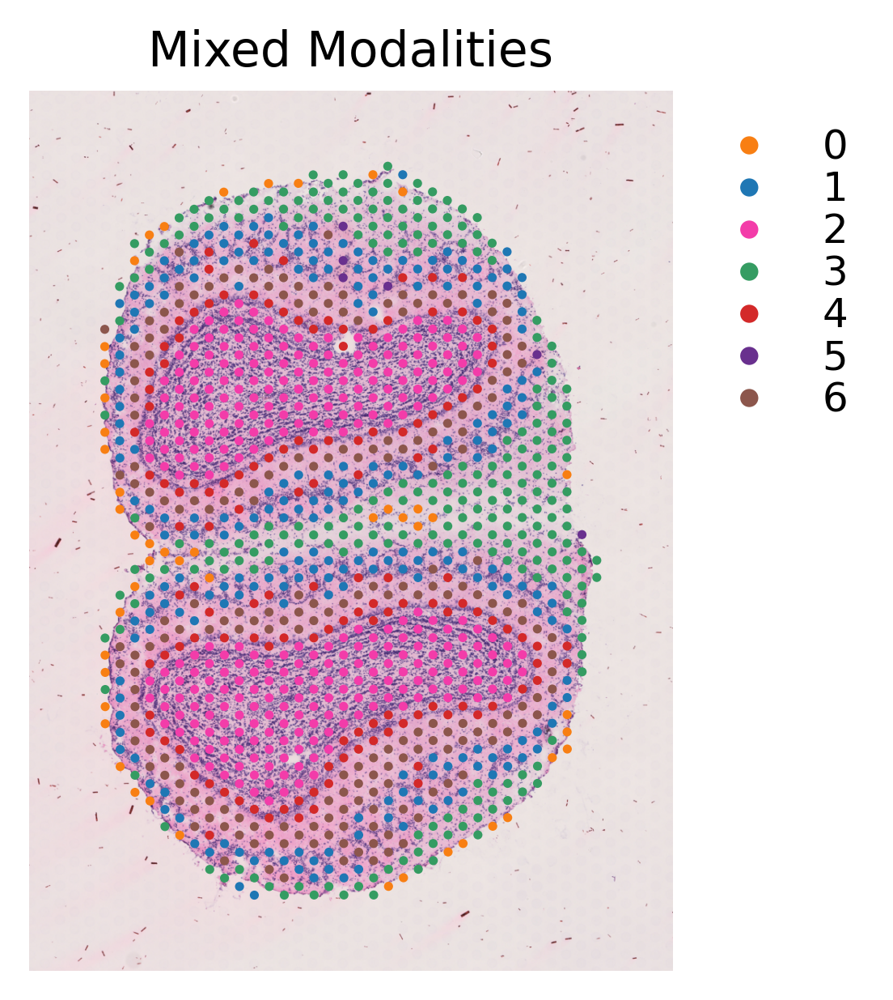

In [ ]:
import torch
from tqdm import tqdm
import numpy as np
import pandas as pd
from scipy.sparse import csr_matrix, vstack as sparse_vstack

final_test_dataloader = torch.utils.data.DataLoader(
                        FinalModelDataset(
                            torch.Tensor(pair_array).to(dtype=torch.int),
                            X.shape[0], X.shape[1],
                            spot_positions,
                             data.obs['tile_path'].values), 
                        batch_size=FINAL_MODEL_BATCH_SIZE, num_workers=NUM_WORKERS, pin_memory=True, shuffle=False)

evaluation_df = FinalModelEvaluator().evaluate(final_model, final_test_dataloader, device)
quantify_evaluation_df(evaluation_df, test_indices)

imputed_data = dropped_data.copy()
imputed_X = imputed_data.X.copy()
imputed_X[evaluation_df['spot_id'], evaluation_df['gene_id']] = evaluation_df['pred_count']
# imputed_X[evaluation_df['spot_id'], evaluation_df['gene_id']] = gene_scaler.inverse_transform(np.array(evaluation_df['pred_count'].values.reshape(n_spots, n_genes))).flatten()
imputed_X = np.clip(imputed_X, 0, np.inf)
imputed_data.X = imputed_X
st.pp.normalize_total(imputed_data)
st.pp.log1p(imputed_data)

stlearn_clustering(imputed_data, 'Mixed Modalities')
